In [125]:
import pandas as pd
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer

In [126]:
df = pd.read_csv("Maindf29122022.csv")

In [127]:
df.head()

,Unnamed: 0,Unnamed: 0.1,id,host_since,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,accommodates,bedrooms,...,neighover_tfidf491,neighover_tfidf492,neighover_tfidf493,neighover_tfidf494,neighover_tfidf495,neighover_tfidf496,neighover_tfidf497,neighover_tfidf498,neighover_tfidf499,Translatedcomments
0,0,0,44077,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,['We enjoyed our stay very much The room was c...
1,1,1,85156,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,...,0.0,0.0,0.0,0.0,0.122717,0.0,0.0,0.0,0.0,['Teresa and family were lovely hosts They wer...
2,2,2,159889,2.039449,0.0,-0.106488,-0.105271,1.0,-1.062338,-0.569968,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,['Margaret is very helpful and attentive She a...
3,3,3,162809,2.036150,1.0,-0.111424,-0.111146,1.0,1.585458,0.518073,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,['Robbie was very welcoming and we had a very ...
4,4,4,165828,2.032851,0.0,-0.096617,-0.102333,1.0,1.055899,-0.569968,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,['We had a wonderful time staying in Grainnes ...


In [128]:
df = df.drop(columns=["Unnamed: 0","Unnamed: 0.1","id"],axis=1)

In [5]:
REVIEWS = []
for i in range(len(df)):
    a = df.Translatedcomments[i]
    a = re.sub('[^a-zA-Z0-9 ]', '', a)
    tk_q = a.split(" ")
    sent = ""
    for j in tk_q:
        ps = PorterStemmer()
        sent = sent + " " + ps.stem(j).upper()
    a = sent.upper()
    a = a.split()
    for word in a:
        if word not in stop_words:
            sentences = " ".join(a)
    REVIEWS.append(sentences)

In [6]:
REVIEWS

['WE ENJOY OUR STAY VERI MUCH THE ROOM WA COMFORT NEAT AND CLEAN THERE WERE NO PROBLEM AT ALL AND THE HOST FAMILI WA VERI HELP AND CARE THEY HELP US PLAN TRIP OR RECOMMEND SIGHT BR BRTHE HOUS IS SITUAT IN A CALM NEIGHBOURHOOD CLOSE THE THE LUA AND DIFFER BU LINE BR BRTHERE ARE NO NEG ASPECT TO MENTION IT WA A VERI SATISFI STAY I WOULD RECOMMEND IT AND STAY THERE AGAIN WHENEV I AM IN DUBLIN BR BR WE HAVE BEEN HERE 4 NIGHT STAY IN A HOME IS THE BEST WAY TO IMPROV YOUR ENGLISH BRVERI LOVE PLACE VERI LOVE AND KIND HOST HELP US TO PLAN OUR DAY TO OPTIM THE TIME BRWE RECCOMEND YOU THI COTTAG BRTERESA YOU ARE A GREAT PERSON BRSOLI TERESA AND HUGHI WERE GREAT HOST THEY WERE VERI WELCOM TO US AND THE CHILDREN THE ROOM WA VERI COMFOT AND WE WERE ABL TO USE THE KITCHEN WHICH WA GREAT SINC WE HAD THE CHILDREN THE KITCHEN IS WARM AND SUNNI WITH GREAT VIEW TO THE GARDEN THEY HAVE WIFI AND WERE GREAT AT PROVID INFO BU TO THE CITI PASS THE DOOR PLU THE TRAM GOOD SHOP PUB CINEMA LIBRARI ETC NOT FAR AWA

In [129]:
df["REVIEWS"] = REVIEWS

In [130]:
df = df.drop(columns=["Translatedcomments"],axis=1)

In [67]:
#df.to_csv("/Users/vipulghare/Desktop/Trinity College Dublin/Sem 1/Machine Learning/Main_Vipul_csv.csv")

In [69]:
#df.to_csv("/Users/vipulghare/Desktop/Trinity College Dublin/Sem 1/Machine Learning/Finaldf.csv")

In [164]:
df = pd.read_csv("Finaldf.csv")

# ModelTraining

In [165]:
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

In [166]:
for i in df.columns:
    if df[i].isna().sum()>0:
        print(i,"True")

In [167]:
print(pd.isnull(df).any().any())

False


In [168]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor

In [169]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7567 entries, 0 to 7566
Columns: 1223 entries, Unnamed: 0 to REVIEWS
dtypes: float64(1221), int64(1), object(1)
memory usage: 70.6+ MB


In [172]:
df

,Unnamed: 0,host_since,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,accommodates,bedrooms,beds,price,...,neighover_tfidf491,neighover_tfidf492,neighover_tfidf493,neighover_tfidf494,neighover_tfidf495,neighover_tfidf496,neighover_tfidf497,neighover_tfidf498,neighover_tfidf499,REVIEWS
0,0,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,0.123630,-0.095952,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,WE ENJOY OUR STAY VERI MUCH THE ROOM WA COMFOR...
1,1,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,-0.614788,-0.098514,...,0.0,0.0,0.0,0.0,0.122717,0.0,0.0,0.0,0.0,TERESA AND FAMILI WERE LOVE HOST THEY WERE WEL...
2,2,2.039449,0.0,-0.106488,-0.105271,1.0,-1.062338,-0.569968,-0.614788,-0.117307,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,MARGARET IS VERI HELP AND ATTENT SHE AND HER H...
3,3,2.036150,1.0,-0.111424,-0.111146,1.0,1.585458,0.518073,1.600464,-0.087410,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,ROBBI WA VERI WELCOM AND WE HAD A VERI GOOD TI...
4,4,2.032851,0.0,-0.096617,-0.102333,1.0,1.055899,-0.569968,0.862047,0.058660,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,WE HAD A WONDER TIME STAY IN GRAINN APART THE ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7562,7562,0.416445,0.0,-0.116360,-0.114083,1.0,-0.532779,-0.569968,-0.614788,0.015096,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7563,7563,-0.013497,0.0,-0.111424,-0.111146,0.0,-1.062338,-0.569968,-0.614788,-0.114744,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7564,7564,-0.302691,0.0,-0.111424,-0.111146,1.0,-0.532779,0.518073,0.123630,-0.101077,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7565,7565,-1.093301,0.0,-0.116360,-0.111146,0.0,-0.532779,-0.569968,-0.614788,0.049264,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT


In [188]:
Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)

/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/1884944608.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


In [189]:
Y = Y.drop(columns=["review_scores_rating"],axis=1)

In [190]:
Y

,review_scores_rating_Scaled
0,522.049383
1,526.431725
2,504.793050
3,548.758735
4,459.540682
...,...
7562,449.007958
7563,449.007958
7564,449.007958
7565,449.007958


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 100 is 14707.237709840643


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 500 is 14333.344067176024


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 1000 is 14092.11034132179


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 1500 is 13627.086917784705


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 2000 is 13520.298114301168


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 2500 is 14835.200543941077


/var/folders/bs/t55xb19x4xlb9rmy6mztrj2h0000gn/T/ipykernel_57837/3667991311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)


MSE for 5000 is 14920.978193817598


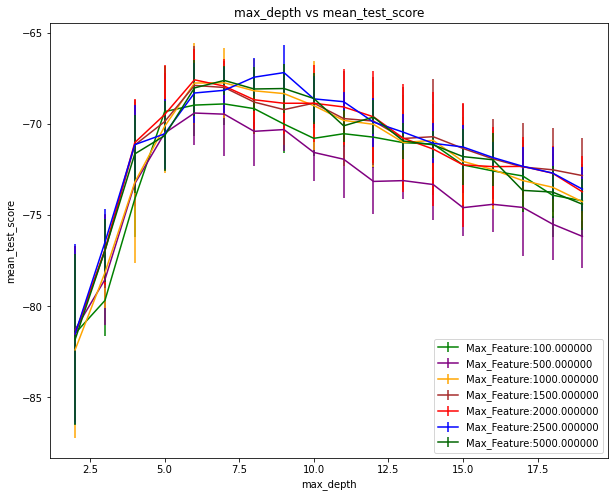

In [193]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_rating"]]
    Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)
    Y = Y.drop(columns=["review_scores_rating"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score")
plt.legend()

In [195]:
min(mse_list)

13520.298114301168

In [198]:
mf[mse_list.index(min(mse_list))]

2000

In [205]:
from sklearn.dummy import DummyRegressor

In [207]:
vectorizer = TfidfVectorizer(max_features=2500)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,2500,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_rating"]]
Y['review_scores_rating_Scaled']=np.power((Y['review_scores_rating']),4)
Y = Y.drop(columns=["review_scores_rating"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=33)
dtr = DecisionTreeRegressor(random_state=21,max_depth=7)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 12114.540807
baseline is : 17418.529304
Our model is accepted


In [208]:
#review_scores_accuracy

In [209]:
import warnings
warnings.filterwarnings("ignore")

MSE for 100 is 10536.747085621806
MSE for 500 is 14092.318393578238
MSE for 1000 is 13032.515973127674
MSE for 1500 is 10720.212092201597
MSE for 2000 is 10661.224834983292
MSE for 2500 is 11877.298046706946
MSE for 5000 is 10759.701011967356


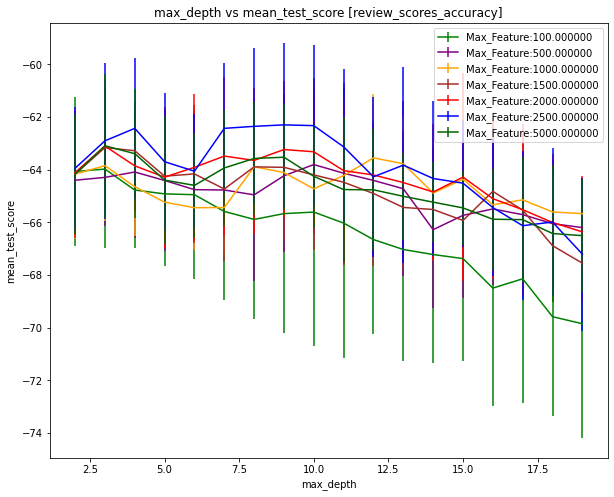

In [210]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_accuracy"]]
    Y['review_scores_accuracy_Scaled']=np.power((Y['review_scores_accuracy']),4)
    Y = Y.drop(columns=["review_scores_accuracy"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_accuracy]")
plt.legend()

In [213]:
mf[mse_list.index(min(mse_list))]

100

In [227]:
vectorizer = TfidfVectorizer(max_features=2500)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,2500,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_accuracy"]]
Y['review_scores_accuracy_Scaled']=np.power((Y['review_scores_accuracy']),4)
Y = Y.drop(columns=["review_scores_accuracy"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=33)
dtr = DecisionTreeRegressor(random_state=21,max_depth=6)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 9964.415332
baseline is : 10736.957667
Our model is accepted


In [228]:
#review_scores_cleanliness

MSE for 100 is 17299.23795338947
MSE for 500 is 18799.818838266932
MSE for 1000 is 18743.06948554862
MSE for 1500 is 17783.342843720024
MSE for 2000 is 17723.290299554166
MSE for 2500 is 18471.70507826482
MSE for 5000 is 19486.281717852886


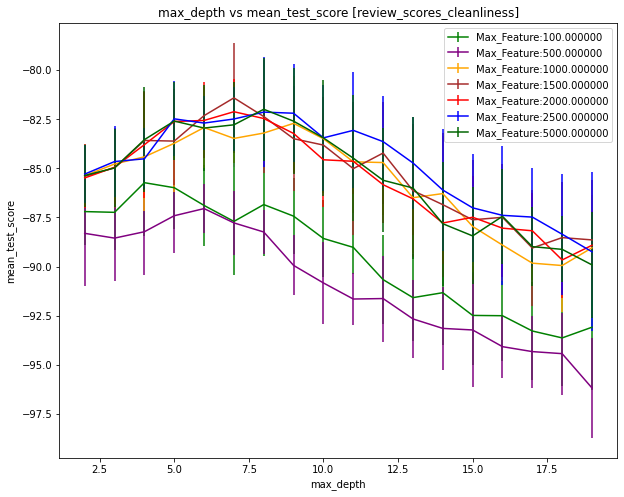

In [229]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_cleanliness"]]
    Y['review_scores_cleanliness_Scaled']=np.power((Y['review_scores_cleanliness']),4)
    Y = Y.drop(columns=["review_scores_cleanliness"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_cleanliness]")
plt.legend()

In [230]:
vectorizer = TfidfVectorizer(max_features=2000)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,2000,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_cleanliness"]]
Y['review_scores_cleanliness_Scaled']=np.power((Y['review_scores_cleanliness']),4)
Y = Y.drop(columns=["review_scores_cleanliness"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
dtr = DecisionTreeRegressor(random_state=21,max_depth=7)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 16095.694938
baseline is : 16820.044702
Our model is accepted


In [231]:
#review_scores_checkin

MSE for 100 is 9918.695986444554
MSE for 500 is 9918.695986444554
MSE for 1000 is 9364.513660083829
MSE for 1500 is 9391.331945947191
MSE for 2000 is 9030.246582416336
MSE for 2500 is 9369.935108079071
MSE for 5000 is 9025.214683935834


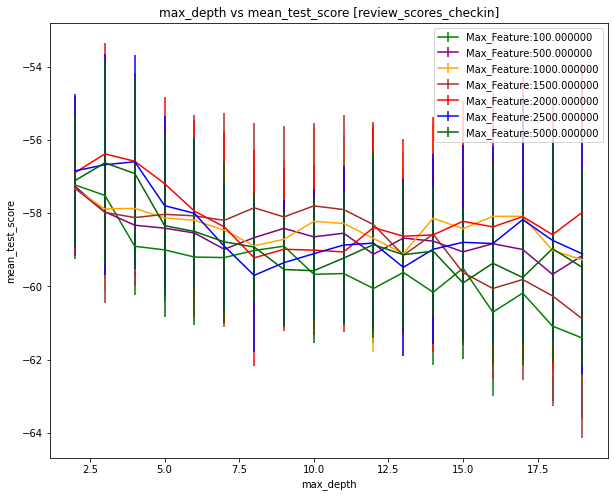

In [232]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_checkin"]]
    Y['review_scores_checkin_Scaled']=np.power((Y['review_scores_checkin']),4)
    Y = Y.drop(columns=["review_scores_checkin"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_checkin]")
plt.legend()

In [234]:
vectorizer = TfidfVectorizer(max_features=2000)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,2000,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_checkin"]]
Y['review_scores_checkin_Scaled']=np.power((Y['review_scores_checkin']),4)
Y = Y.drop(columns=["review_scores_checkin"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
dtr = DecisionTreeRegressor(random_state=21,max_depth=2)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 7876.665427
baseline is : 8995.261726
Our model is accepted


In [235]:
#review_scores_communication

MSE for 100 is 10236.549266788852
MSE for 500 is 9169.392219262765
MSE for 1000 is 9896.86646795619
MSE for 1500 is 9222.860828491259
MSE for 2000 is 10574.091057108883
MSE for 2500 is 10049.950043004776
MSE for 5000 is 10562.826206578717


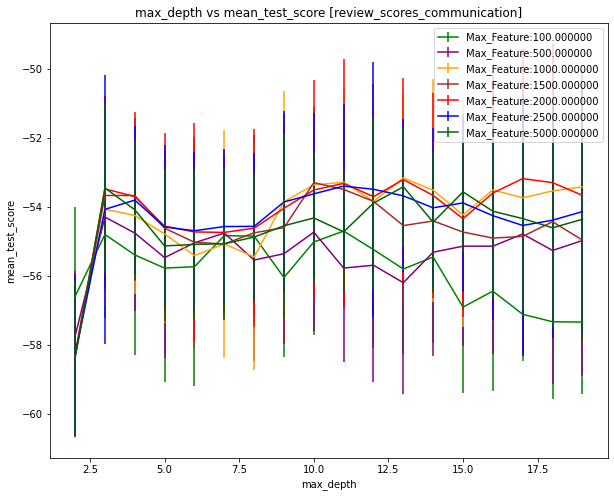

In [237]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_communication"]]
    Y['review_scores_communication_Scaled']=np.power((Y['review_scores_communication']),4)
    Y = Y.drop(columns=["review_scores_communication"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_communication]")
plt.legend()

500

In [243]:
vectorizer = TfidfVectorizer(max_features=2000)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,2000,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_communication"]]
Y['review_scores_communication_Scaled']=np.power((Y['review_scores_communication']),4)
Y = Y.drop(columns=["review_scores_communication"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
dtr = DecisionTreeRegressor(random_state=21,max_depth=13)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 7563.113421
baseline is : 8280.603836
Our model is accepted


In [244]:
#review_scores_location

MSE for 100 is 12253.171011780078
MSE for 500 is 13188.116951343765
MSE for 1000 is 11296.533227660579
MSE for 1500 is 13611.89278032331
MSE for 2000 is 13116.018276029083
MSE for 2500 is 12099.93246369336
MSE for 5000 is 11999.422034341153


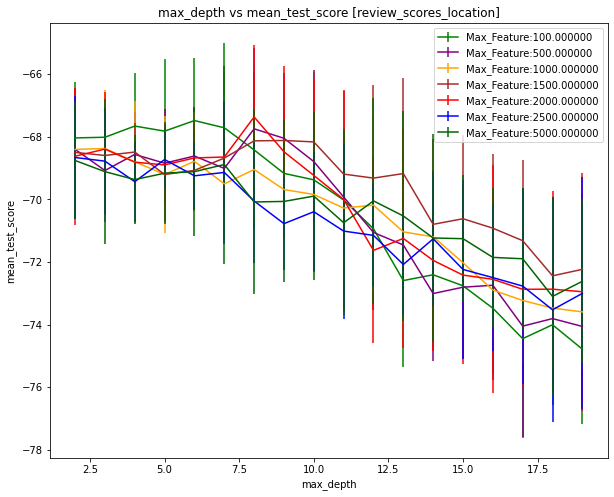

In [245]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_location"]]
    Y['review_scores_location_Scaled']=np.power((Y['review_scores_location']),4)
    Y = Y.drop(columns=["review_scores_location"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_location]")
plt.legend()

In [254]:
vectorizer = TfidfVectorizer(max_features=1000)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,1000,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_location"]]
Y['review_scores_location_Scaled']=np.power((Y['review_scores_location']),4)
Y = Y.drop(columns=["review_scores_location"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
dtr = DecisionTreeRegressor(random_state=21,max_depth=4)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 9816.354576
baseline is : 10479.022780
Our model is accepted


In [258]:
df.re

,Unnamed: 0,host_since,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,accommodates,bedrooms,beds,price,...,neighover_tfidf491,neighover_tfidf492,neighover_tfidf493,neighover_tfidf494,neighover_tfidf495,neighover_tfidf496,neighover_tfidf497,neighover_tfidf498,neighover_tfidf499,REVIEWS
0,0,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,0.123630,-0.095952,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,WE ENJOY OUR STAY VERI MUCH THE ROOM WA COMFOR...
1,1,2.401216,1.0,-0.111424,-0.111146,1.0,-0.532779,-0.569968,-0.614788,-0.098514,...,0.0,0.0,0.0,0.0,0.122717,0.0,0.0,0.0,0.0,TERESA AND FAMILI WERE LOVE HOST THEY WERE WEL...
2,2,2.039449,0.0,-0.106488,-0.105271,1.0,-1.062338,-0.569968,-0.614788,-0.117307,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,MARGARET IS VERI HELP AND ATTENT SHE AND HER H...
3,3,2.036150,1.0,-0.111424,-0.111146,1.0,1.585458,0.518073,1.600464,-0.087410,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,ROBBI WA VERI WELCOM AND WE HAD A VERI GOOD TI...
4,4,2.032851,0.0,-0.096617,-0.102333,1.0,1.055899,-0.569968,0.862047,0.058660,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,WE HAD A WONDER TIME STAY IN GRAINN APART THE ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7562,7562,0.416445,0.0,-0.116360,-0.114083,1.0,-0.532779,-0.569968,-0.614788,0.015096,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7563,7563,-0.013497,0.0,-0.111424,-0.111146,0.0,-1.062338,-0.569968,-0.614788,-0.114744,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7564,7564,-0.302691,0.0,-0.111424,-0.111146,1.0,-0.532779,0.518073,0.123630,-0.101077,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT
7565,7565,-1.093301,0.0,-0.116360,-0.111146,0.0,-0.532779,-0.569968,-0.614788,0.049264,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,REVIEW NOT PRESENT


In [256]:
#review_scores_value

MSE for 100 is 15371.433609856716
MSE for 500 is 14627.141931646247
MSE for 1000 is 16013.333957577257
MSE for 1500 is 14661.192802445044
MSE for 2000 is 15245.128865230303
MSE for 2500 is 15994.626772341097
MSE for 5000 is 15160.556900080672


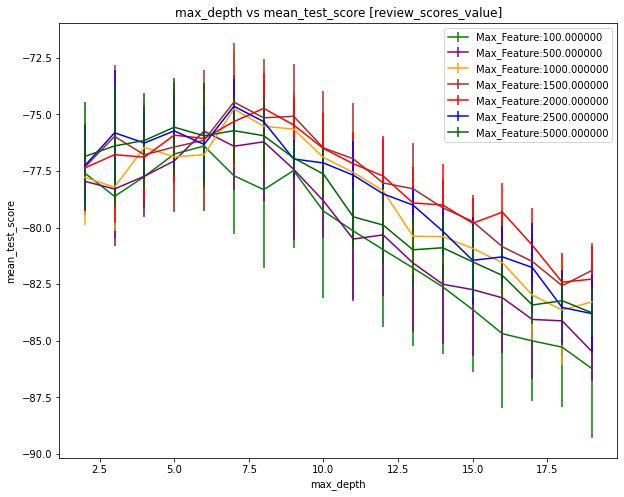

In [259]:
mse_list = []
plt.figure(figsize=(10,8))
mf = [100,500,1000,1500,2000,2500,5000]
color = {100:"green", 
         500:"purple",
        1000:"orange", 
         1500:"brown", 
         2000:"red", 
         2500:"blue", 
         5000:"darkgreen"}
for i in mf:
    vectorizer = TfidfVectorizer(max_features=i)
    reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
    reviewsTFIDF = reviewsTFIDF.toarray()
    df1 = pd.DataFrame(data=reviewsTFIDF)
    df1.columns = ['review' + str(x) for x in range(0,i,1)]
    H = df
    H = H.join(df1)
    H = H.drop(columns=["REVIEWS"],axis=1)
    X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
    Y = H[["review_scores_value"]]
    Y['review_scores_value_Scaled']=np.power((Y['review_scores_value']),4)
    Y = Y.drop(columns=["review_scores_value"],axis=1)
    xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
    tp = {"max_depth":range(2,20,1)}
    dtr = DecisionTreeRegressor(random_state=21)
    cv = GridSearchCV(dtr,tp,scoring="neg_mean_absolute_error")
    cvmodel = cv.fit(xtrain,ytrain)
    dataframe = pd.DataFrame(cvmodel.cv_results_)
    maxdepth = cvmodel.best_params_.get("max_depth")
    dtr = DecisionTreeRegressor(criterion='mae',random_state=21,max_depth=maxdepth)
    model = dtr.fit(xtrain,ytrain)
    pred = model.predict(xtest)
    print("MSE for {} is {}".format(i,mean_squared_error(pred,ytest)))
    mse_list.append(mean_squared_error(pred,ytest))
    plt.errorbar(dataframe["param_max_depth"],dataframe["mean_test_score"],yerr=dataframe["std_test_score"],color=color[i],label="Max_Feature:%f"%i)
plt.xlabel('max_depth')
plt.ylabel('mean_test_score')
plt.title("max_depth vs mean_test_score [review_scores_value]")
plt.legend()

In [260]:
mf[mse_list.index(min(mse_list))]

500

In [261]:
vectorizer = TfidfVectorizer(max_features=500)
reviewsTFIDF = vectorizer.fit_transform(df.REVIEWS)
reviewsTFIDF = reviewsTFIDF.toarray()
df1 = pd.DataFrame(data=reviewsTFIDF)
df1.columns = ['review' + str(x) for x in range(0,500,1)]
H = df
H = H.join(df1)
H = H.drop(columns=["REVIEWS"],axis=1)
X = H.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness","review_scores_checkin","review_scores_communication","review_scores_location","review_scores_value"])
Y = H[["review_scores_value"]]
Y['review_scores_value_Scaled']=np.power((Y['review_scores_value']),4)
Y = Y.drop(columns=["review_scores_value"],axis=1)

xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=21)
dtr = DecisionTreeRegressor(random_state=21,max_depth=6)
model = dtr.fit(xtrain,ytrain)
pred = model.predict(xtest)
mse = mean_squared_error(ytest,pred) 
print("Model MSE is : %f" %mse)
dummy = DummyRegressor(strategy="mean").fit(X, Y) 
ydummy = dummy.predict(X)
mse_dummy = mean_squared_error(Y,ydummy)
print("baseline is : %f" %mean_squared_error(Y,ydummy))
if(mse_dummy>mse): 
    print("Our model is accepted")
else:
    print("Our model isnt accepted")

Model MSE is : 13212.442929
baseline is : 13632.679059
Our model is accepted
